In [ ]:
$ source $HOME/hrwros_ws/devel/setup.bash
$ roslaunch moveit_setup_assistant setup_assistant.launch

In [ ]:
$HOME/hrwros_ws/src/hrwros/hrwros_moveit_config

In [ ]:
$ cd src/hrwros/hrwros_moveit_config
$ cd config
$ cd ../launch

In [ ]:
$ roscd hrwros_moveit_config/
$ more package.xml

# **Week 4: MoveIt Setup Assistant**


# **4.3.1 MoveIt Setup Assistant - Part 1**




* `hrwros`
 * `hrwros_msgs`

* `hrwros_gazebo`

* ` hrwros_week4`

* `hrwros_assignments`

 * `hrwros_week4_assignment`
 * `week4_moveit_config`




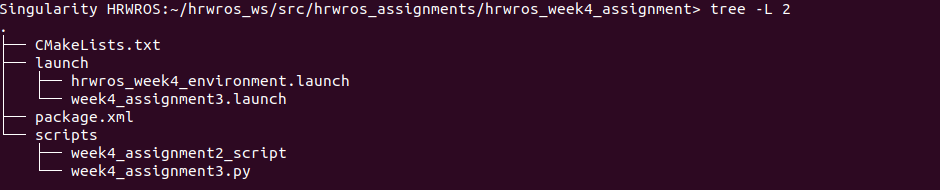

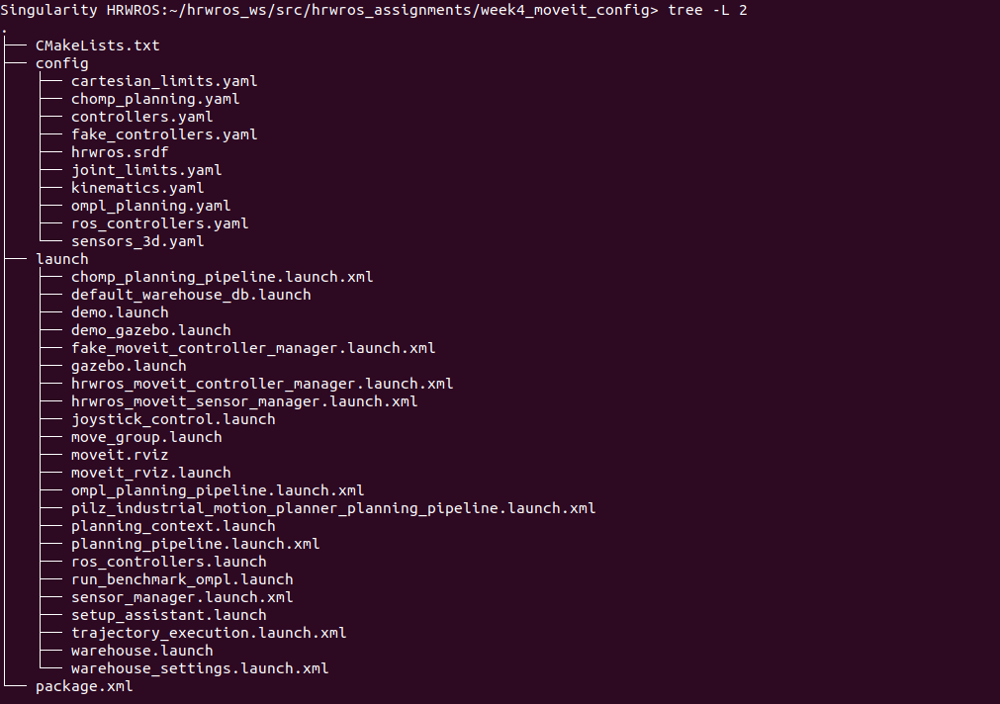

* How to **use the `MoveIt` Setup assistant tool that helps us configure** almost everything we need to work with `MoveIt`.


**`Important Note:`**

The version of the MoveIt Setup Assistant used in this video is older than the version you will be using in this course. This newer version introduces three new submenus:

1. ROS Control

2. Simulation

3. 3D Perception

In the context of this course, these are not needed and can be left blank.



## **1.1 MoveIt! Setup Assistant**

**`Step 1 :`** First setup your ROS environment and launch the setup assistant.

In [ ]:
$ source $HOME/hrwros_ws/devel/setup.bash

$ roslaunch moveit_setup_assistant setup_assistant.launch

* This gives a graphical interface where you will need to perform the following steps.


**`Step 2 :`** Click on Create New `Moveit Configuration` Package


**`Step 3 :`**  Add the URDF file path of the Robot Model

  * Browse to `$HOME/hrwros_ws/src/hrwros_support/urdf/hrwros.xacro` or add the full path to that file (i.e. replacing `$HOME` by the actual folder name)


**`Step 4 :`**  Click on Load Files to load the `model`

 * On the right side, a graphical view of the `factory` will be provided

 * The TurtleBot will no be seen on your display as we will not use MoveIt to control it

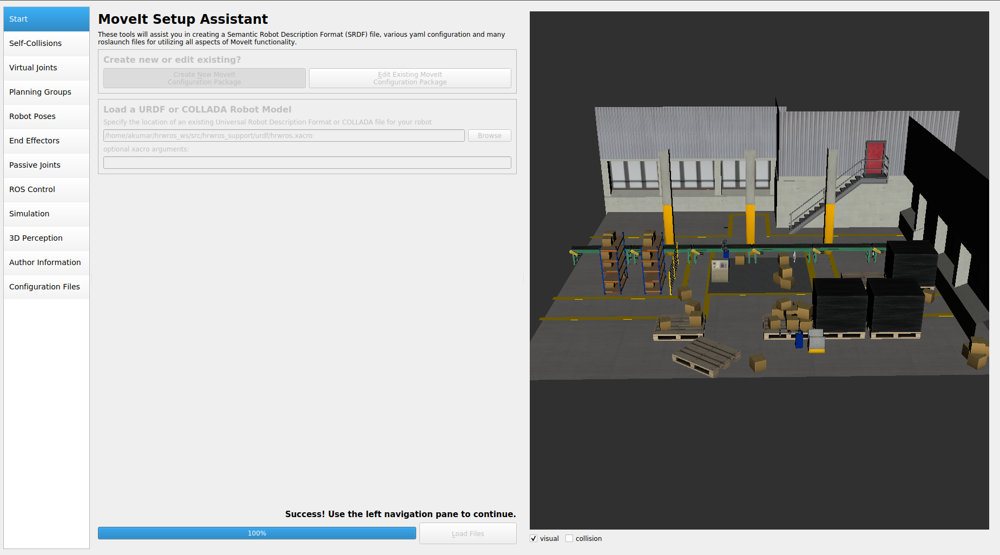

## **1.2 Function explanation**

###  **1. Self-Collision Checking** 
 It is in (left pane) here we set up information regarding **what pairs of robot links should be checked for collision**.


This saves execution time:

**`Step 5 :`**  Set the Sampling Density to High and Click on **`Generate Collision Matrix`**.

`MoveIt` checks Self-Collision by **sampling random joint** values and checking if the configuration collides

* This is done using the **collision geometry** of the `URDF` files. 

* This process provides a list of link pairs that can be disabled because they can never collide with each other.

**`Step 6 :`** CLick on **`Show Enabled Pairs `**

`Question :`  **And how does MoveIt! do this?**

* It does so by sampling random joint values for the robot joints and checks
if the resulting configuration collides with something in the environment.


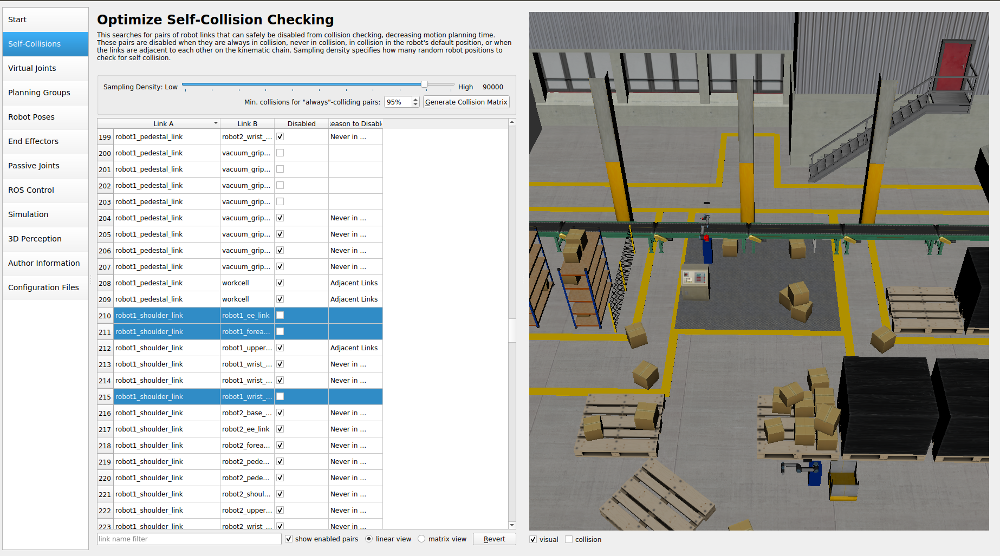

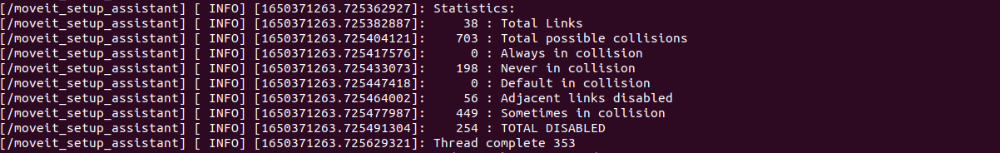

### **2. Virtual joints :** 
 These are an optional step to give MoveIt a fixed reference in our world this is handy for robot arms on mobile platforms:
 
**`Step 7 :`**
  * Define that our **`URDF`** is a (**`fixed_base1`**)fixed  reference point with respect to **`robot1_base_link`**. 
  * The same needs to be done for **`robot2_base_link`**.

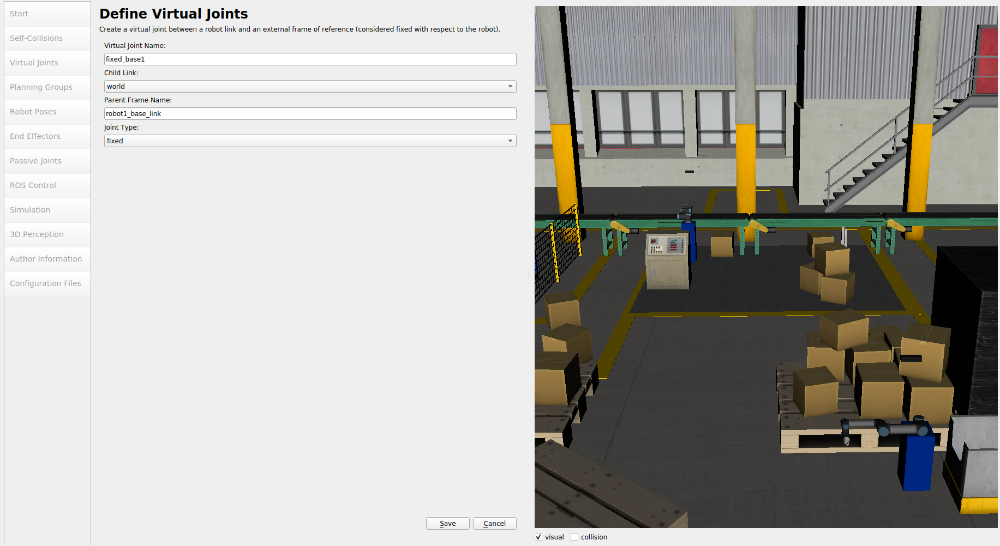

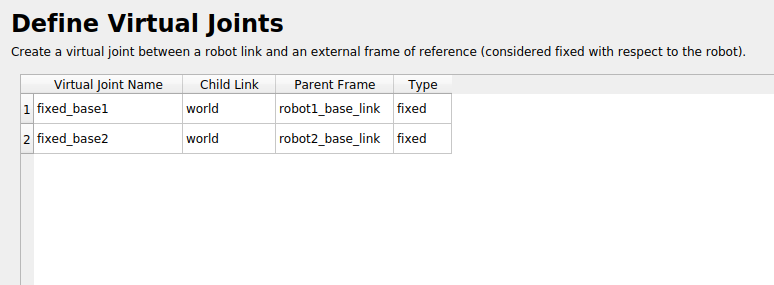

###  **3. Planning Groups :**

Indicate a **set of `links` and `joints` for which we intend to plan motions using `MoveIt`!**

We want to do this for our two robot arms:

**`Step 7 :`**
* Add Group

 * Give the **group a name** : `robot1`

 * **Kinematic Solver**: `trac_ik_kinematics_plugin/TRAC_IKKinematicsPlugin`

 * Group Default Planner: `RRTConnect`
  
 * Add **Kinematic Chain**
    * start: `robot1_base_link`
    * end: `vacuum_gripper1_suction_cup`


* This needs to be done for any number of robots we would like to control with MoveIt.

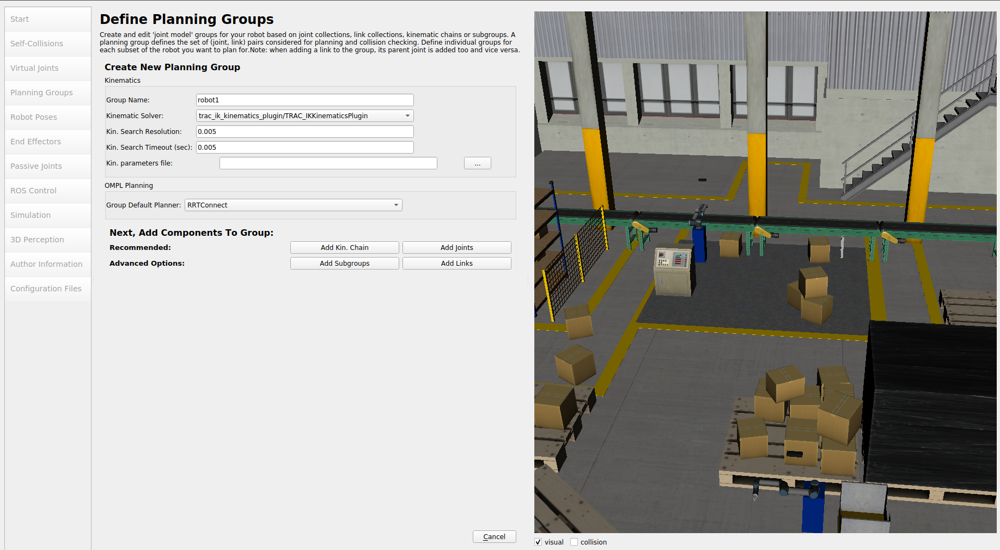

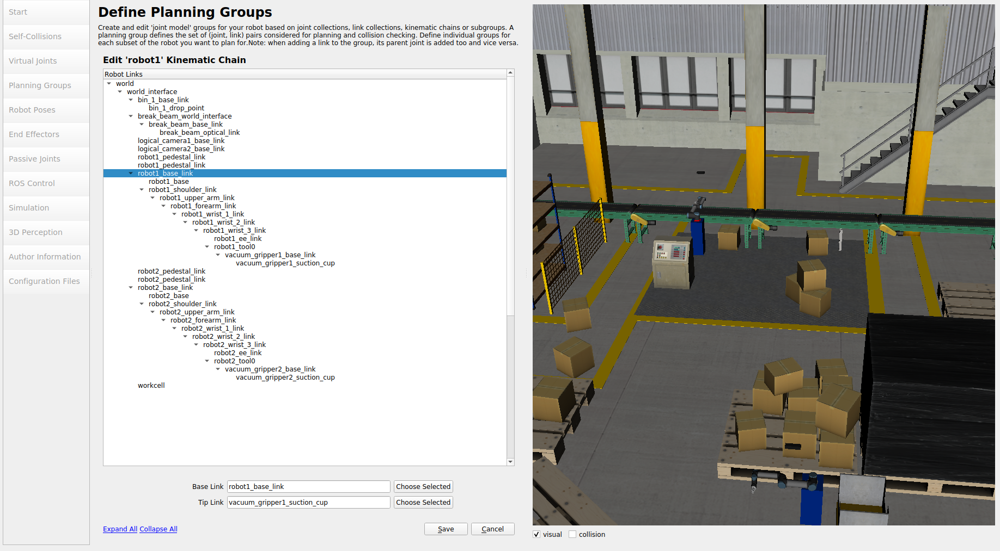

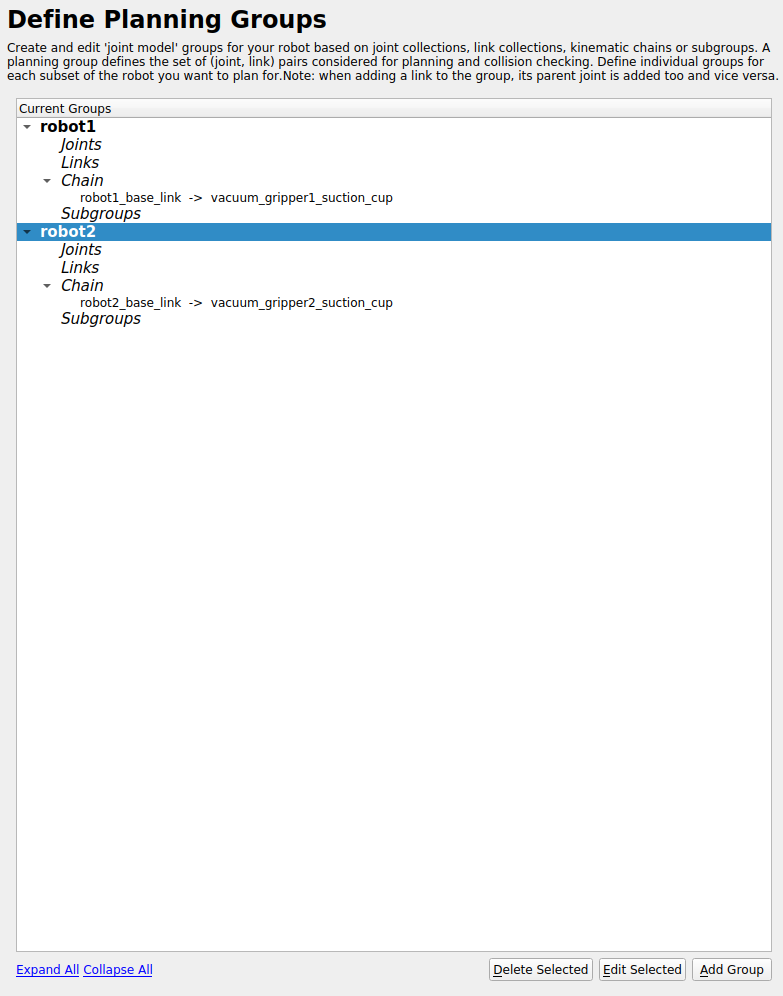


### **`Question 1 :` MoveIt setup assistant**

* Which of the following ROS nodes are running when we start the `MoveIt setup assistant` with roslaunch?

```
a) /move_group

b) /moveit_setup_assistant
```

**`Correct Ans: (b)`** 
*  The MoveIt! setup assistant GUI is also a ROS node that is started with the `roslaunch` command we use to start the `setup assistant`.


### **`Question 2 :` Self-collisions**

* The **Self-collisions** `checking` step is useful because:


```
a) It reduces planning time by disabling collision checks that are useless .

b) It can alert users about broken links in the URDF

c) It knows everything about how the joints of the different robots should move to avoid collisions.
```

**`Correct Ans: (a)`** 
*  Yes, the resulting **`Collision matrix`** contains information about all **link pairs that will never collide either due to their geometric configuration** or it is physically impossible for them to collide.


### **`Question 3:` Virtual joints**

Ques: Virtual joints are always fixed joints

```
a) True

b) False
```

**`Correct Ans: (b)`** 
*  Yes, virtual joints are only used to **`indicate a fixed reference`** to our robots, but **it is not necessary that they are always configured as fixed**.


### **`Question 4:` Planning group**

Ques: Virtual joints are always fixed joints

```
a) A planning group always starts at the base link of the robot and ends at the end effector link of the robot.

b) We can also use combinations of links and joints to define planning groups.

c) A portion of a kinematic chain can also be configured as a planning group.

d) The links and joints specified as a part of a planning group are what MoveIt considers for motion planning and collision checking.
```

**`Correct Ans: (c), (d)`** 

*  **Incorrect**: Planning groups need not always start at the base link of a robot and end at the end-effector link.

* **`Incorrect:`** This is only true as long as the chosen links and joints are a part of the same kinematic chain.

* **`Correct:`** We can also define sub groups of links and joints in a kinematic chain to be a planning group. 
 * For example, one arm of a humanoid robot.

* **`Correct:`** Yes, MoveIt! plans motions and performs collision checking for a given planning group.


# **3.2 MoveIt Setup Assistant - Part 2**

## **2.1 Function explanation**

### **4. Robot Poses** 
It  define sets of joint values for particular planning groups.

*  In this context in `MoveIt` poses are defined as sets of joint values.

* Define two sets of joint values:

**`Step 8 :`**

**`Robot 1 `**

* Click Add `Pose`

* Planning Group: `robot1`

* `robot1_shoulder_pan_joint`: Move the slider slightly (0.4143 rad)

* `robot1_shoulder_lift_joint`: `-1.57 rad` (90deg turn)

* `robo1_wrist_1_joint`: `-1.57 rad `(90deg turn)

* Pose Name: `R1Up`


**`Robot 2`**

 * Click Add `Pose`
 
 * Planning Group: `robot2`

 * `robot1_shoulder_pan_joint`: Move the slider slightly (0.4143 rad)
 
 * `robot2_shoulder_lift_joint`: `-1.57 rad` (90deg turn)

* `robot2_wrist_1_joint`: `-1.57 rad` (90deg turn)

* Pose Name: `R2Up`


* Once we define the real controllers the motion will look much smoother.



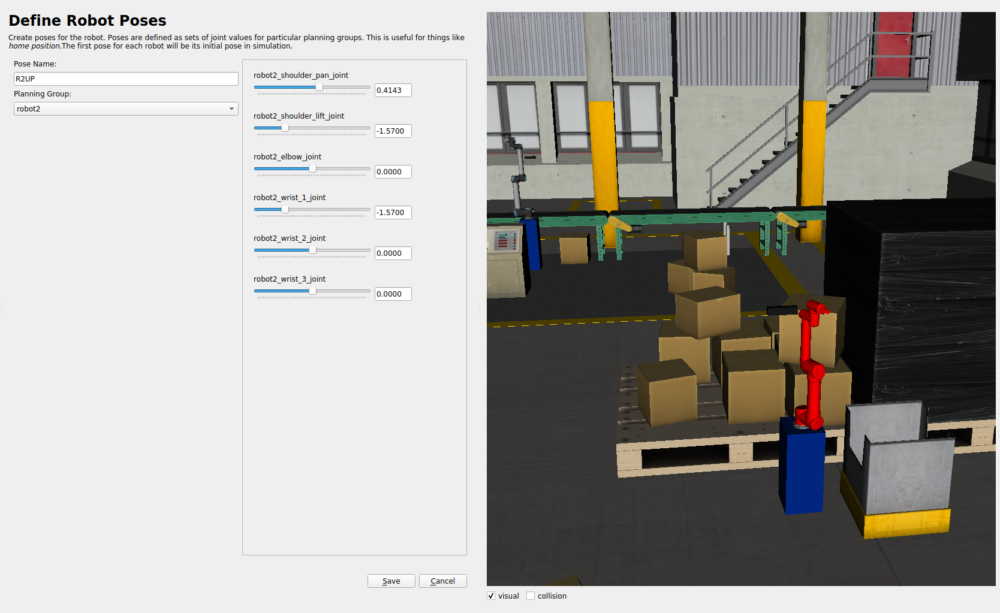

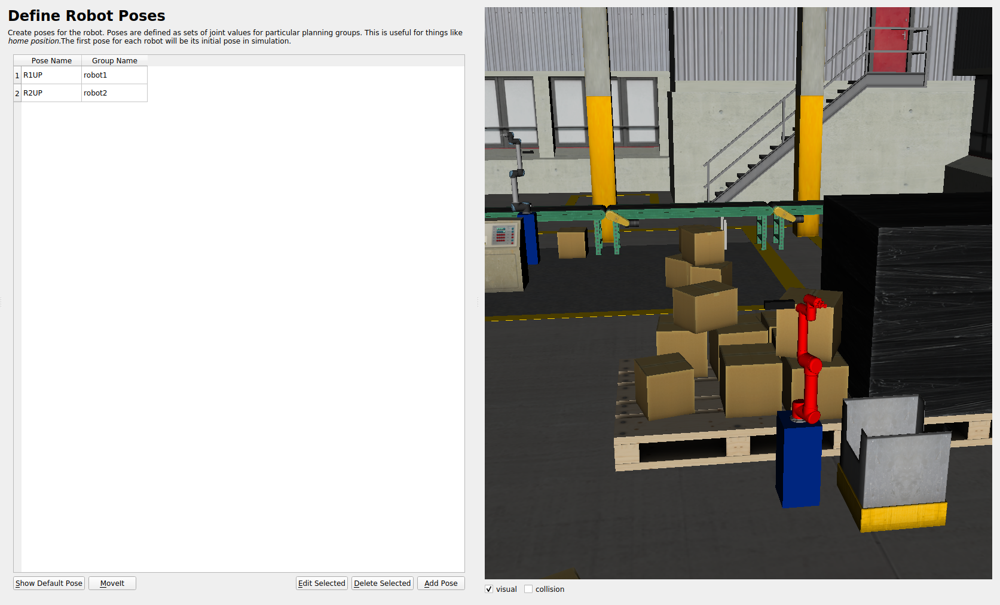

**`Show Default Pose: `**

* Then, we can also for example click on the show default pose and click on the MoveIt! button which for now brings the robot to its newly defined configuration instantaneously.

* But, that's because it uses a fake controller to move between the configurations.

* Once we define the real controllers in the following modules
the motion will look much smoother.

## **2.2 MSA Units**

### **5. End Effectors :**
  We can define the set of `links` and `joints`.
 * Also, we can let `MoveIt` plan our end effectors. 
 * For now, we leave it empty






### **6. Passive Joints :** 
Specify one or multiple robot joints as passive.
 *  MoveIt will then consider these joints as not available for planning. 



### **7. Author Information :**
It  is required as this generates a `ROS` package.



### **8. Generate Configuration Files :** 
* Displays files with information about the choices we made in the previous steps so the `MoveGroup` node can use it. 

 * Specify the desired directory

In [ ]:
$HOME/hrwros_ws/src/hrwros/hrwros_moveit_config

* Generate Package
 * Confirm that no end effectors have been added

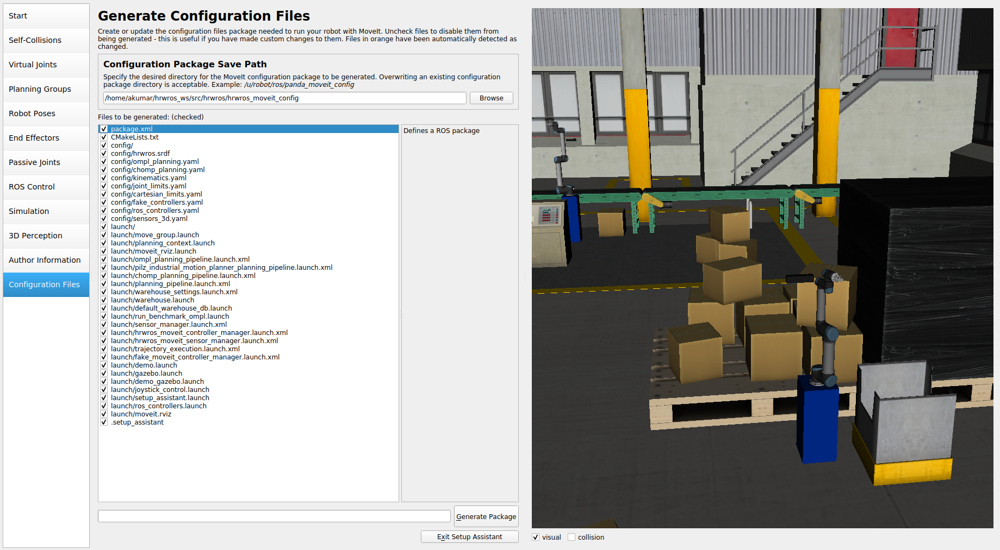

## **2.3 Generate package**

In [ ]:
$ cd src/hrwros/hrwros_moveit_config
$ cd config
$ cd ../launch

We see configuration files and a `launch` folder containing a lot of `launch` files.

*  We will focus mostly on **`move_group.launch`**.


### **`Question 1 :` Robot poses**

* Robot poses in the setup assistant are defined using Positions and Orientations of the end effector of the specified group:

```
a) True

b) False
```

**`Correct Ans: (b)`** 
*  Robot poses in the setup assistant are defined as a set of joint values for a group.



### **`Question 2 :` Passive Joints**

* We learned that including any of the movable robot joints in the list of passive joints will tell MoveIt! that such joints should not be used for motion planning or kinematics computation.
*  Based on this, which of the following statements are true?



```
a) Passive joints will stop moving in the simulated robot or on real-hardware.

b) Passive joints can still move in simulation and real hardware.

c) Joints used to specify caster wheels in mobile robots are examples of passive joints.
```

**`Correct Ans: (b), (c)`** 




* **`Incorrect (a):`** Passive joints can still move in the real-robot or in simulation.
 *  Remember, passive joint specification is only a **"soft(ware)-lock"**.

*  Passive joints can certainly move in simulation (For ex: using the joint state publisher GUI) or in real-hard via a robot driver. 
 * The only thing is, MoveIt! will not know nor care about those joints for motion planning and kinematics.

* **Caster wheels** on mobile robots are wheels that do not have any motor that controls them, but they are used for steering, particularly in differentially driven mobile robots.


### **`Question 3 :` Configuration Files**

* In the configuration files panel of the MoveIt setup assistant, we are given an overview of all the files and folders that will be generated.
* And these files will go into a ROS package. Where do we specify the name and path of this ROS package?

```
a) MoveIt! knows where this package should be generated automatically.

b) We specify the name and path to the ROS package in the "Configuration Package Save Path" widget on the Setup assistant window. 
```

**`Correct Ans: (b)`**

* Since this ROS package is associated with our ROS application, it should have a path similar to any other ROS package we have in our ROS workspace


# **3.3 MoveIt Setup Assistant - MoveIt configuration package**


## **3.1 Build configuration package**

**First build and inspect the newly created configuration package:**



1. After creating a new package we build it and source our updated setup files. 

In [ ]:
$ cd $HOME/hrwros_ws
$ catkin build
$ source $HOME/hrwros_ws/devel/setup.bash

2. Navigate and look into the package.xml file.


In [ ]:
$ roscd hrwros_moveit_config/
$ more package.xml

There you can see the author details and a set of dependencies.



## **3.2 Contents of the package**



### **1. `move_group.launch`** 

Open the **`hrwros_moveit_config`** package, in an external editor, by looking at the launch files we can see how it works.

1. Let's begin with the  **`launch/move_group.launch`** file.

* At the beginning of the file there are two group of settings related to code debugging and logging settings. 
 * These will be untouched in this course.



2. Then we have a few parameters:

 1. **`pipeline`**: investigated soon

 2. **`allow_trajectory_execution`**: investigated soon

 3. **`fake_execution`**: investigated soon

 4. **`max_safe_path_cost`** associated: integrating sensory information (not necessary in this course) 

 5. **`jiggle_fraction`**: integrating sensory information (not necessary in this course) 

 6. **`publish_monitored_planning_scene`**: a parameter used by the **`PlanningSceneMonitor`** (not necessary in this course)

In [ ]:
  <!-- move_group settings -->
  <arg name="pipeline" default="ompl" />
  <arg name="allow_trajectory_execution" default="true"/>
  <arg name="fake_execution" default="false"/>

They are associated with advanced MoveIt! capabilities such as replanning an alternate path by integrating sensory information.

In [ ]:
  <arg name="max_safe_path_cost" default="1"/>
  <arg name="jiggle_fraction" default="0.05" />

### **2. `planning_context.launch`**

3. In the Line 43 we find the **`planning_context.launch`** file.

 Go to **`launch/planning_context.launch :`** Make sure that **`robot_description`** file is available. 
 
 * This is usually loaded and thus the **default** is **`false`**.

In [ ]:
  <arg name="load_robot_description" default="false"/>

4. Go to **`config/hrwros.srdf`**:

 The **`robot_description_semantic`** parameter is located in the `config` folder and contains the following:

 * The semantic information (**`robot1_base_link, vacuum_gripper1_suction_cup`**...)
 
 * The robot configurations or robot poses (**`R1Up`**, **`R2Up`**)
 
 * **Virtual joints**

 * The entire list of link pairs that won't be checked for collision


In [ ]:
<group name="robot1">
        <chain base_link="robot1_base_link" tip_link="vacuum_gripper1_suction_cup"/>
    </group>
    <group name="robot2">
        <chain base_link="robot2_base_link" tip_link="vacuum_gripper2_suction_cup"/>
    </group>
    <!--GROUP STATES: Purpose: Define a named state for a particular group, in terms of joint values. This is useful to define states like 'folded arms'-->
    <group_state name="R1Up" group="robot1">
        <joint name="robot1_elbow_joint" value="0"/>
        <joint name="robot1_shoulder_lift_joint" value="-1.57"/>
        <joint name="robot1_shoulder_pan_joint" value="0.4143"/>
        <joint name="robot1_wrist_1_joint" value="-1.57"/>
        <joint name="robot1_wrist_2_joint" value="0"/>
        <joint name="robot1_wrist_3_joint" value="0"/>
    </group_state>

5. Go to **`config/joint_limits.yaml:`**

 * Joint-specific limits for each of the robot arms are updated here.

6. Go to **`config/kinematics.yaml:`**
 * Here we have the specifications of the plugin or library we.use. 




In [ ]:
robot1:
  kinematics_solver: trac_ik_kinematics_plugin/TRAC_IKKinematicsPlugin
  kinematics_solver_search_resolution: 0.005
  kinematics_solver_timeout: 0.005
robot2:
............
..............


7. Go back to **`launch/move_group.launch`**

### **3. `planning_pipeline.launch.xml`**

8. The next **`config`** file mentioned in the video is the **`planning_pipeline.launch.xml`** found in line 51.

 * It uses the pipeline argument from the begging go the file, remember that it was set by **default** to **`ompl`**. 

In [ ]:
  <arg name="pipeline" default="ompl" />

  <include file="$(find week4_moveit_config)/launch/$(arg pipeline)_planning_pipeline.launch.xml" />

####  **`ompl_planning_pipeline.launch.xml`**

9. Go to **`launch/ompl_planning_pipeline.launch.xml`**:

 * You will find a lot of internal settings for using the **`ompl`** planning library. 





In [ ]:
 <!-- Add MoveGroup capabilities specific to this pipeline -->
  <!-- <param name="capabilities" value="" /> -->

  <rosparam command="load" file="$(find week4_moveit_config)/config/ompl_planning.yaml"/>

10. Go to **`config/ompl_planning.yaml:`**
 * You will find a whole list of available planners. 





In [ ]:
robot1:
  default_planner_config: RRTConnect
  planner_configs:
    - AnytimePathShortening
    - SBL
    - EST
    - LBKPIECE
    - BKPIECE
    - KPIECE
    - RRT
    - RRTConnect
    - RRTstar
    - TRRT
    - PRM
    - PRMstar
    - FMT
    - BFMT
    - PDST
    - STRIDE
    - BiTRRT
    - LBTRRT
    - BiEST
    - ProjEST
    - LazyPRM
    - LazyPRMstar
    - SPARS
    - SPARStwo

11. Go back to **`launch/move_group.launch`**



In [ ]:
  <!-- Planning Pipelines -->
  <!-- Trajectory Execution Functionality -->
  <!-- Sensors Functionality -->
      <!-- Publish the planning scene of the physical robot so 
      that rviz plugin can know actual robot -->

### **4.`trajectory_execution.launch.xml`**

12. The next interesting file is on line 73, the **`trajectory_execution.launch.xml`**.

* It uses the **`moveit_manage_controllers`** parameter, which  takes care of trajectory execution and 
 * manages controllers, 
 * and the aforementioned **`fake_execution`** parameter, although we're interested on the real one.



13. Go to **`launch/hrwros_moveit_controller_manager.launch.xml:`**



In [ ]:
  <arg name="moveit_controller_manager" default="moveit_simple_controller_manager/MoveItSimpleControllerManager" />
  <param name="moveit_controller_manager" value="$(arg moveit_controller_manager)"/>

  <!-- loads ros_controllers to the param server -->
  <rosparam file="$(find week4_moveit_config)/config/controllers.yaml"/>



### **`Question 1 :` MoveIt setup assistant**

* Which of the following libraries is configured as default by the MoveIt setup assistant?

```
a) RRTConnect

b) OMPL
```

**`Correct Ans: (b)`** 
* `MoveIt` setup assistant configures `OMPL` as the **default planning library**.



### **`Question 2 :` Trajectory execution**

* In the video lecture, it is shown that we will not let MoveIt take care of trajectory execution because we are working with a simulated environment. 


```
a) True

b) False
```

**`Correct Ans: (b)`** 
*  It is shown that we will allow MoveIt to take care of trajectory execution.
 
* Despite working with simulated hardware, we can still execute trajectories with simulated controllers.



# **3.4 MoveIt Setup Assistant - Required Additional Steps**


**`Important Notes:`**

1. Only do this steps once, after creating a new `MoveIt configuration` package using the `MoveIt Setup Assistant`.

2. You only need to edit two files:




In [ ]:
hrwros_moveit_config/launch/move_group.launch
hrwros_moveit_config/launch/trajectory_execution.launch.xml

##  **1.  Remap `/joint_states` to `/combined_joint_states`**



* This **allows us to handle the different robots on the simulations.**

**Step 1:** Open the file `move_group.launch` in the newly generated `hrwros_moveit_config/launch` folder.




**`Step 2: `**Go to line 96, just under the string 



In [ ]:
<param name="disable_capabilities" value="$(arg disable_capabilities)"/>

**`Step 3:`** Add the following string below this line:



In [ ]:
<remap from="/joint_states" to="/combined_joint_states"/>

After that, Lines 95 and 96 of `move_group.launch `file should look like this:



In [ ]:
<param name="disable_capabilities" value="$(arg disable_capabilities)" />
<remap from="/joint_states" to="/combined_joint_states"/>

## **2.  Remove unneeded Planning Pipelines**

* The **`MSA`** generates launch files for two additional Planning Pipelines  (`CHOMP`  and `Pilz Industrial Motion)`,

* Those are not needed and can generate error messages during launch, so we can remove them,

**Step 1:** Open the file `move_group.launch` in the newly generated 
* `hrwros_moveit_config/launch` folder.

**Step 2:** Go to line 55, 
 * where the string `<!-- CHOMP --> `is found.



**Step 3:** Delete or comment out lines 55 to 58,
*  that's where the `CHOMP` pipeline is included.



In [ ]:
<!-- CHOMP -->
  <!-- <include ns="chomp" file="$(find hrwros_moveit_config)/launch/planning_pipeline.launch.xml">
    <arg name="pipeline" value="chomp" />
  </include> -->

**Step 4:** Go to line 60, 
* where the string `<!-- Pilz Industrial Motion--> `is found.



**Step 5:** Delete or comment out lines 60 to 63, 

* that's where the `Pilz Industrial Motion pipeline` is included.

In [ ]:
<!-- Pilz Industrial Motion-->
  <!-- <include ns="pilz_industrial_motion_planner" file="$(find moveit_resources_prbt_moveit_config)/launch/planning_pipeline.launch.xml">
    <arg name="pipeline" value="pilz_industrial_motion_planner" />
  </include> -->

## **3. - Change `trajectory_execution/allowed_start_tolerances`**


* In order to ensure the correct work of the controllers.

* It's also necessary to change the `allowed_start_tolerances` parameters.

**Step 1:** Open the file `trajectory_execution.launch.xml `

* In the newly generated `hrwros_moveit_config/launch` folder.



**Step 2:** Go to line 16, find the string 

In [ ]:
 <param name="trajectory_execution/allowed_start_tolerance" value="0.01"/> <!-- default 0.01 -->

**Step 3:** Change the parameter value to `"0.1"`



In [ ]:
<param name="trajectory_execution/allowed_start_tolerance" value="0.1"/> <!-- default 0.01 -->

## **4. Remove  unused arguments from trajectory execution**

* The **`trajectory_execution.launch.xml`** file generated contains the unused argument 
 
 * `"execution_type"` that can cause errors during launch.

* In order to ensure the correct this, you just need to delete this argument from the file.



**Step 1:** Open the file **`trajectory_execution.launch.xml`** in the newly generated 
 * **`hrwros_moveit_config/launch`** folder.

**Step 2:** Go to line 21, find the string  




In [ ]:
<arg name="execution_type" value="$(arg execution_type)" />

**Step 3:** Delete or comment out that line, 
* to remove the argument from the include statement.



In [ ]:
   <!--  <arg name="execution_type" value="$(arg execution_type)" /> -->

# **3.5 MoveIt Setup Assistant - configuring controllers**

## **1. Configuring controllers: Where? What? How?**

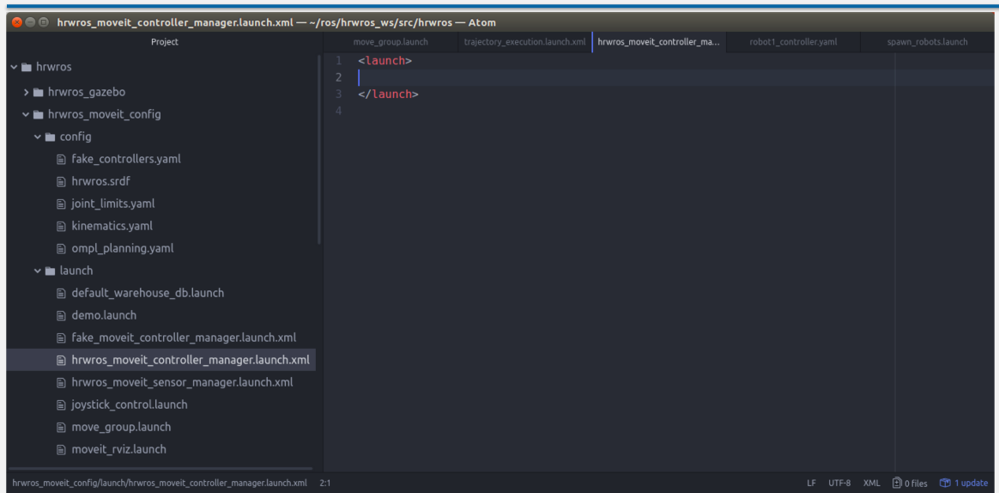

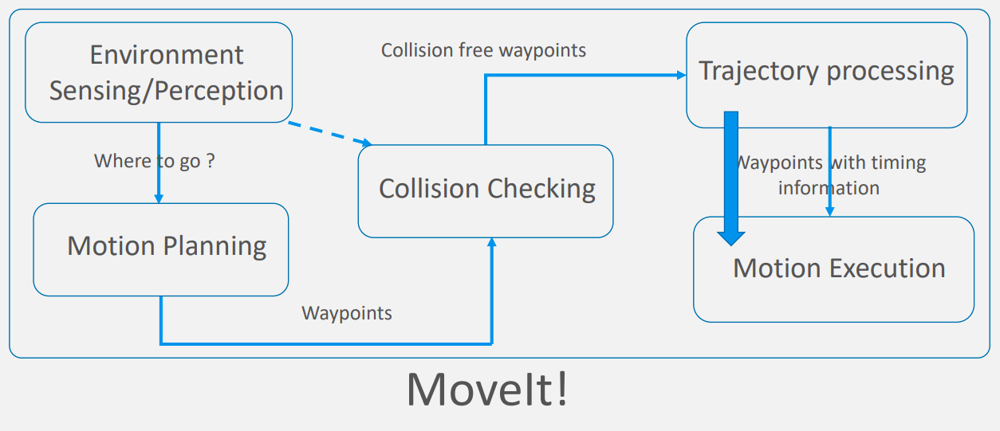

### **1.1 About controllers**

* Gazebo uses controllers to control the motion and to know the poses and status of the robot.


* MoveIt plans movements and send those movements to the controllers in Gazebo.




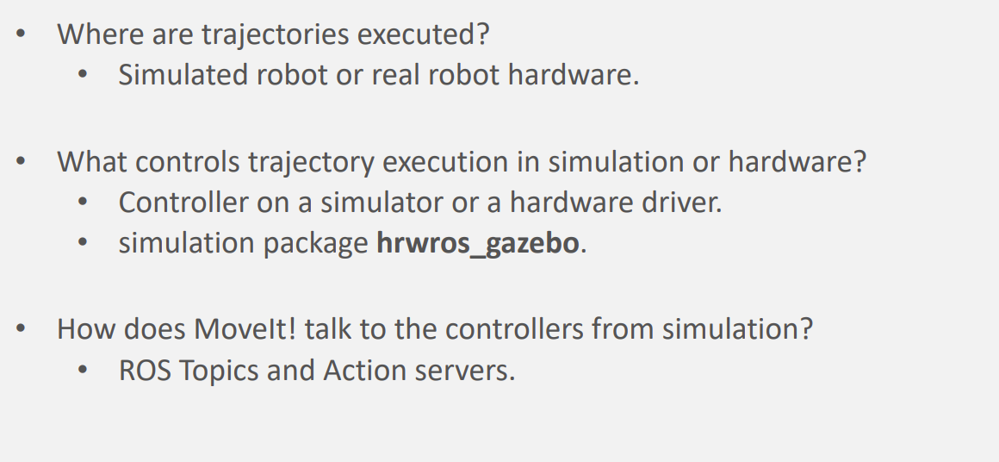

### **1.2 Components of Gazebo and MoveIt**

**Gazebo uses:**


* **`JointStateController`**  to publish current joint values (like a sensor)

* **`JointTrajectoryController`** to control the execution of trajectories sent by MoveIt. 

**MoveIt uses:**

* **`Planning scene monitor`** to update position of things it know (robot arms or other objects)

* **`Simple Controller Manager `**to send the desired movements to the trajectory controller.



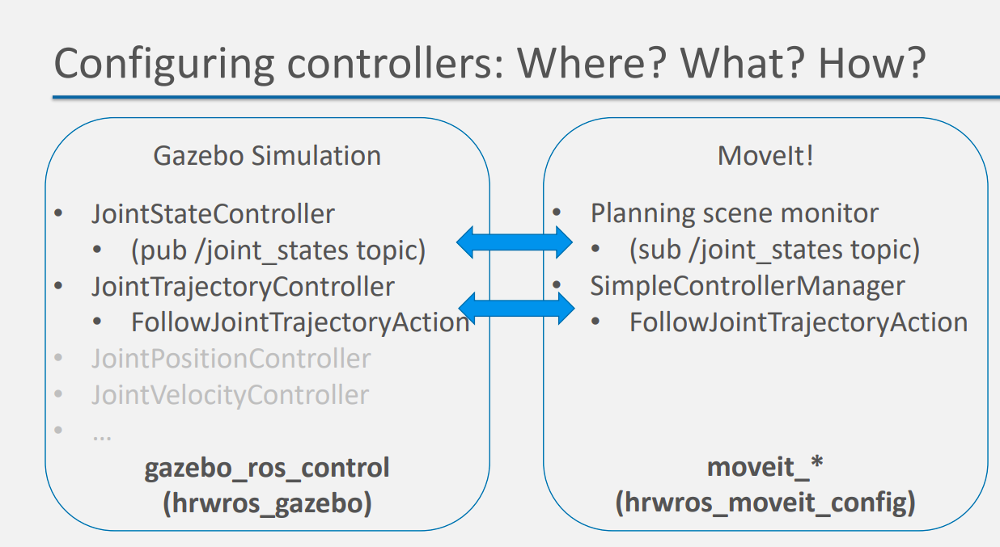

### **3. Gazebo Simulation and MoveIt**



1. **`hrwros_gazebo`**

Controllers are provided as ROS action servers: 
* They need to be powered by nodes! We can launch them using launch files.

* The launchers are found on the launch folder.

* The **`spawn_robots.launch`** file contains these settings for the two controllers of each robot.


In [ ]:
 <!-- Load the controllers for robot1. -->
    <rosparam file="$(find hrwros_gazebo)/config/r1_joint_state_controller.yaml" command="load"/>
    <rosparam file="$(find hrwros_gazebo)/config/robot1_controller.yaml" command="load"/>

2. **`hrwros_moveit_config`**

* In **`hrwros_moveit_config`** the controller files are also under the **`config`** folder.



* **`controllers.yaml `**

In [ ]:
controller_list:
 - name: robot1/robot1_controller
   action_ns: follow_joint_trajectory
   type: FollowJointTrajectory
   joints: ["robot1_elbow_joint",
           "robot1_shoulder_lift_joint",
           "robot1_shoulder_pan_joint",
           "robot1_wrist_1_joint",
           "robot1_wrist_2_joint",
           "robot1_wrist_3_joint"]
 - name: robot2/robot2_controller
   action_ns: follow_joint_trajectory
   type: FollowJointTrajectory
   joints: ["robot2_elbow_joint",
           "robot2_shoulder_lift_joint",
           "robot2_shoulder_pan_joint",
           "robot2_wrist_1_joint",
           "robot2_wrist_2_joint",
           "robot2_wrist_3_joint"]


 *  Go to the launcher folder and open edit the **`hrwros_moveit_controller_manager.launch.xml `**file.

  *  which controller manager system we want to use from MoveIt, and the file from the previous point where we defined the controller. 
 


In [ ]:
  <!-- loads ros_controllers to the param server -->
  <rosparam file="$(find hrwros_moveit_config)/config/ros_controllers.yaml"/>

* With New controller name 

In [ ]:
  <!-- loads ros_controllers to the param server -->
  <rosparam file="$(find hrwros_moveit_config)/config/controllers.yaml"/>

This is how the controllers that we specified in the **`controllers.yaml`** file gets loaded 
* on to the ROS parameter server so that **`move_group`** ROS node can use it for trajectory execution.


### **`Question 1 :` Import facts**

* The following statements are true. 


```
1) The administrative information to be filled in to the controllers.yaml file can be found in the hrwros_gazebo package.

2) The joint state controller for each robot publishes the joint state information for each robot.

4) The simulated controllers to control the robot arms are provided by a Gazebo (via gazebo_ros_control ROS package).
```

**`Correct Ans: (all)`** 

1. The administrative information such as controller names,
 *  their namespaces and joints that are controlled by these controllers can be obtained from the **`hrwros_gazebo`** package.

2. The joint state controller is more like a sensor publishing joint state information for each robot arm at the sepcified rate.

3. The simulated controllers are indeed provided by Gazebo via the **`gazebo_ros_control`** package that comes with the course simulation.
